### Sasikumar Jayapal
### Babita Chaini
### Sangeeta Kumari
### Sai Manoj Thirunahari

In [ ]:
#Import Libraries
import requests
from bs4 import BeautifulSoup
import numpy as np
import pandas as pd
import os

# Importing country data from CSV to dbo.Country table

In [384]:
#Set current working directory
#os.chdir('C:\Msc Data Analytics\Database and Analytics program\DAP_PRJ\Project files\Source_Files')

In [385]:
df_country=pd.read_csv("wikipedia-iso-country-codes.csv",encoding = 'utf8',keep_default_na=False,na_values=['_'])

In [386]:
df_country.rename(columns = {'English short name lower case':'Country_Name', 'Alpha-2 code':'Country_Code_2D','Alpha-3 code':'Country_Code_3D','Numeric code':'Country_Id','Numeric code':'Country_Id','ISO 3166-2':'ISO_Code'}, inplace = True)

In [387]:
df_long_lat=pd.read_csv("country_lat.csv",encoding = 'utf8',keep_default_na=False,na_values=['_'])

In [388]:
#df_country=df_country.reindex(columns=['Country_Name','Country_Code_2D','Country_Code_3D','Country_Id','ISO_Code','country','Latitude','Longitude'])

In [389]:
#Adding 'Country_Code','Country_Id' by using left outer join with df_country
df_country_full = pd.merge(df_country, df_long_lat[['country','latitude','longitude']],how='left', left_on='Country_Code_2D',right_on='country')

In [390]:
#df_country_full=df_country_full.drop(columns=['country'])

In [391]:
#df_country_full=df_country_full.reset_index(drop=True, inplace=True)

In [392]:
df_country_full.head()

,Country_Name,Country_Code_2D,Country_Code_3D,Country_Id,ISO_Code,country,latitude,longitude
0,Aland Islands,AX,ALA,248,ISO 3166-2:AX,AX,60.178525,19.915610
1,Afghanistan,AF,AFG,4,ISO 3166-2:AF,AF,33.939110,67.709953
2,Albania,AL,ALB,8,ISO 3166-2:AL,AL,41.153332,20.168331
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,DZ,28.033886,1.659626
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,AS,-14.270972,-170.132217


# Web Scraping risk data from the wiki page using BeautifulSoup

In [393]:
# Making a GET request
r = requests.get('https://en.wikipedia.org/wiki/List_of_countries_by_natural_disaster_risk')
print(r)

<Response [200]>


In [394]:
#Web scraping using BeautifulSoup

soup = BeautifulSoup(r.content, 'html.parser')

#s = soup.find('table', class_= 'wikitable sortable jquery-tablesorter')
#print(s)
header=[]
content = soup.find('tr')

for string in content.strings:
    #print(string)
    lst_not_in=['\n','[2]','[3]','[4]','[5]','[6]']
    if (string not in lst_not_in):
        string=string.replace('\n','')
        header.append(string)
 
print(header)

text=soup.find_all('td')

inner_list = []

for i in range(len(text)):
    val_ = text[i].get_text(strip=True)
    val_=val_.replace('\n','')
    inner_list.append(val_)
    
new_list = []

for i in range(0, len(inner_list), 6):
    new_list.append(inner_list[i:i+6])

['Rank', 'Country', '2016', '2013', '2012', '2011']


# MongoDB connectivity

In [395]:
import pymongo as pym
import pandas as pd
from pymongo import MongoClient

In [396]:
from pymongo import MongoClient
#connect on the default host and port.
client = MongoClient(host="localhost", port=27017)

In [397]:
dblist = client.list_database_names()

print(dblist)

['US_Disaster', 'admin', 'config', 'local', 'test_database']


In [398]:
#Function to load data from web to MongoDB
def mongoimport(soup, db_name, coll_name,db_url='localhost', db_port=27017):
    data_dict={}
    db = client[db_name]
    coll = db[coll_name]
    data_dict["data"] = soup
    coll.insert_one(data_dict)

In [399]:
#Defining DB name and Collection name
database_name='Natural_Disaster'
collection_name='Risk_Rate'

In [400]:
#Loading data from web to MongoDB
mongoimport(new_list, database_name, collection_name)

In [401]:
from pandas import DataFrame
def retrieve_data(database_name,collection_name):
    #client = MongoClient('localhost', 27017,username='dap',password='dap')
    # Database Name
    db = client[database_name]
    # Collection Name
    col = db[collection_name]
    x = col.find()
    return x

In [402]:
#retriving data from MongoDB
data=retrieve_data(database_name,collection_name)

In [403]:
list_cur = list(data)
#print(list_cur)
test=list_cur[0].get("data")
# df = DataFrame()
df_risk = pd.DataFrame(test)

In [404]:
df_risk

,0,1,2,3,4,5
0,1,Qatar,0.08%,0.11%,0.10%,0.02%
1,2,Malta,0.60%,0.61%,0.61%,0.72%
2,3,Saudi Arabia,1.14%,1.32%,1.31%,1.26%
3,4,Barbados,1.32%,1.16%,1.15%,2.44%
4,5,Grenada,1.42%,1.44%,1.44%,2.29%
...,...,...,...,...,...,...
167,168,Guatemala,19.88%,20.88%,20.75%,20.88%
168,169,Philippines,26.70%,27.52%,27.98%,24.32%
169,170,Tonga,29.33%,28.23%,28.62%,29.08%
170,171,Vanuatu,36.28%,36.43%,36.31%,32.00%


In [405]:
# text[1].get_text(strip=True)

In [406]:
# import unicodedata
# unicodedata.normalize("NFKD",(text[1].get_text()))

# Data Preprocessing

In [407]:
#Removing row number 171 as its not relevent
df_risk = df_risk[:-1]

In [408]:
#df_risk

In [409]:
#Assigning header to the data
df_risk.columns=header

In [410]:
#df_risk

In [411]:
#Drop Rank attribute
df_risk.drop(['Rank'],axis=1, inplace=True)

In [412]:
#Removing % from table data
df_risk['2016'] = df_risk['2016'].str.replace(r'%', '').astype(float)
df_risk['2013'] = df_risk['2013'].str.replace(r'%', '').astype(float)
df_risk['2012'] = df_risk['2012'].str.replace(r'%', '').astype(float)
df_risk['2011'] = df_risk['2011'].str.replace(r'%', '').astype(float)

In [413]:
#df_risk

In [414]:
#Calculating average risk score
df_risk['risk_score']=((df_risk['2016']+df_risk['2013']+df_risk['2012']+df_risk['2011'])/4).round(2)

In [415]:
#df_risk

In [416]:
#Defining risk_category from the risk score
df_risk['risk_category'] = np.select(
    [
        df_risk['risk_score'].between(0, 3.60, inclusive=True), 
        df_risk['risk_score'].between(3.60, 5.50, inclusive=True),
        df_risk['risk_score'].between(5.50, 7.60, inclusive=True),
        df_risk['risk_score'].between(7.60, 10.50, inclusive=True),
        df_risk['risk_score'].between(10.50, 100.00, inclusive=True),
    ], 
    [
        'Very Low Risk', 
        'Low Risk',
        'Medium Risk',
        'High Risk',
        'Very High Risk'
    ], 
    default='Unknown'
)

In [417]:
#df_risk

In [418]:
#risk.loc[risk['risk_category']=='Unknown']

In [419]:
df_risk['risk_category'].value_counts()

Medium Risk       43
Very Low Risk     36
Very High Risk    35
Low Risk          29
High Risk         28
Name: risk_category, dtype: int64

In [420]:
#df_country[df_country['Country_Name'].duplicated(keep=False)]

In [421]:
#df_country_full = df_country_full.reindex(columns=['Country_Name','Country_Code_2D','Country_Code_3D','Country_Id','ISO_Code','country','Latitude','Longitude'], fill_value=df_long_lat[['latitude','longitude']])

In [422]:
df_country_full

,Country_Name,Country_Code_2D,Country_Code_3D,Country_Id,ISO_Code,country,latitude,longitude
0,Aland Islands,AX,ALA,248,ISO 3166-2:AX,AX,60.178525,19.915610
1,Afghanistan,AF,AFG,4,ISO 3166-2:AF,AF,33.939110,67.709953
2,Albania,AL,ALB,8,ISO 3166-2:AL,AL,41.153332,20.168331
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,DZ,28.033886,1.659626
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,AS,-14.270972,-170.132217
...,...,...,...,...,...,...,...,...
241,Wallis and Futuna,WF,WLF,876,ISO 3166-2:WF,WF,-13.768752,-177.156097
242,Western Sahara,EH,ESH,732,ISO 3166-2:EH,EH,24.215527,-12.885834
243,Yemen,YE,YEM,887,ISO 3166-2:YE,YE,15.552727,48.516388
244,Zambia,ZM,ZMB,894,ISO 3166-2:ZM,ZM,-13.133897,27.849332


In [423]:
#df_risk

In [424]:
#Adding 'Country_Code','Country_Id' by using left outer join with df_country
df_risk_azuredb = pd.merge(df_risk, df_country_full[['Country_Name','Country_Code_3D','Country_Id','latitude','longitude']],how='left', left_on='Country',right_on='Country_Name').reset_index()

In [425]:
df_risk_azuredb

,index,Country,2016,2013,2012,2011,risk_score,risk_category,Country_Name,Country_Code_3D,Country_Id,latitude,longitude
0,0,Qatar,0.08,0.11,0.10,0.02,0.08,Very Low Risk,Qatar,QAT,634.0,25.354826,51.183884
1,1,Malta,0.60,0.61,0.61,0.72,0.64,Very Low Risk,Malta,MLT,470.0,35.937496,14.375416
2,2,Saudi Arabia,1.14,1.32,1.31,1.26,1.26,Very Low Risk,Saudi Arabia,SAU,682.0,23.885942,45.079162
3,3,Barbados,1.32,1.16,1.15,2.44,1.52,Very Low Risk,Barbados,BRB,52.0,13.193887,-59.543198
4,4,Grenada,1.42,1.44,1.44,2.29,1.65,Very Low Risk,Grenada,GRD,308.0,12.262776,-61.604171
...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,166,Bangladesh,19.17,19.81,20.22,17.45,19.16,Very High Risk,Bangladesh,BGD,50.0,23.684994,90.356331
167,167,Guatemala,19.88,20.88,20.75,20.88,20.60,Very High Risk,Guatemala,GTM,320.0,15.783471,-90.230759
168,168,Philippines,26.70,27.52,27.98,24.32,26.63,Very High Risk,Philippines,PHL,608.0,12.879721,121.774017
169,169,Tonga,29.33,28.23,28.62,29.08,28.82,Very High Risk,Tonga,TON,776.0,-21.178986,-175.198242


In [426]:
#Cleaning 'Country_Name' and 'Country_Id'
df_risk_azuredb.drop(columns=['Country_Name'],inplace=True)
df_risk_azuredb['Country_Id'] = df_risk_azuredb['Country_Id'].fillna(0)
df_risk_azuredb['Country_Id']=df_risk_azuredb['Country_Id'].astype(int)

In [427]:
#Changing the column position
my_column = df_risk_azuredb.pop('Country_Id')
df_risk_azuredb.insert(0, my_column.name, my_column)
my_column = df_risk_azuredb.pop('Country_Code_3D')
df_risk_azuredb.insert(1, my_column.name, my_column)

In [428]:
#Renaming the existing column
df_risk_azuredb=df_risk_azuredb.rename(columns={'2016':'risk_score_2016','2013':'risk_score_2013','2012':'risk_score_2012','2011':'risk_score_2011','Country_Code_3D':'Country_Code'})

In [429]:
df_risk_azuredb = df_risk_azuredb.fillna(value=0)

In [430]:
#Cleaning 'Country' attribute as per ISO standard
df_risk_azuredb['Country'] = np.select(
    [
        df_risk_azuredb['Country'].isin(['Libya']),
        df_risk_azuredb['Country'].isin(['Syria']),
        df_risk_azuredb['Country'].isin(['Brunei']),
        df_risk_azuredb['Country'].isin(['Israel/Palestine'])
    ], 
    [
        'Libyan Arab Jamahiriya',
        'Syrian Arab Republic',
        'Brunei Darussalam',
        'Israel'
    ],
    default=df_risk_azuredb['Country'].str.strip()
)

In [431]:
df_risk_azuredb

,Country_Id,Country_Code,index,Country,risk_score_2016,risk_score_2013,risk_score_2012,risk_score_2011,risk_score,risk_category,latitude,longitude
0,634,QAT,0,Qatar,0.08,0.11,0.10,0.02,0.08,Very Low Risk,25.354826,51.183884
1,470,MLT,1,Malta,0.60,0.61,0.61,0.72,0.64,Very Low Risk,35.937496,14.375416
2,682,SAU,2,Saudi Arabia,1.14,1.32,1.31,1.26,1.26,Very Low Risk,23.885942,45.079162
3,52,BRB,3,Barbados,1.32,1.16,1.15,2.44,1.52,Very Low Risk,13.193887,-59.543198
4,308,GRD,4,Grenada,1.42,1.44,1.44,2.29,1.65,Very Low Risk,12.262776,-61.604171
...,...,...,...,...,...,...,...,...,...,...,...,...
166,50,BGD,166,Bangladesh,19.17,19.81,20.22,17.45,19.16,Very High Risk,23.684994,90.356331
167,320,GTM,167,Guatemala,19.88,20.88,20.75,20.88,20.60,Very High Risk,15.783471,-90.230759
168,608,PHL,168,Philippines,26.70,27.52,27.98,24.32,26.63,Very High Risk,12.879721,121.774017
169,776,TON,169,Tonga,29.33,28.23,28.62,29.08,28.82,Very High Risk,-21.178986,-175.198242


# Kmeans clustering algorithm

In [432]:
from sklearn.cluster import KMeans
df_kmeans=df_risk_azuredb[['risk_score_2016','risk_score_2013','risk_score_2012','risk_score_2011','risk_category']]
df_kmeans_x=df_risk_azuredb[['risk_score_2016','risk_score_2013','risk_score_2012','risk_score_2011']]
df_kmeans_y=df_risk_azuredb['risk_category']

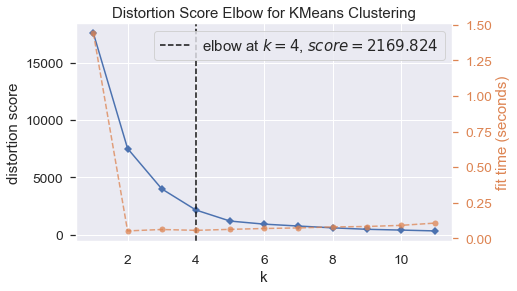

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [433]:
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,12)).fit(df_kmeans_x)
visualizer.show()

In [434]:
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=0).fit(df_kmeans_x)

In [435]:
df_kmeans=pd.concat([df_kmeans.reset_index(drop=True), pd.DataFrame(kmeans.labels_,columns=['Kmeans_Label'])],axis=1)

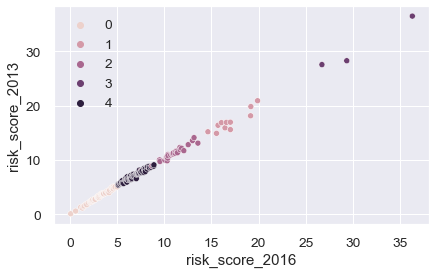

In [436]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.scatterplot(data=df_kmeans_x, x="risk_score_2016", y="risk_score_2013", hue=kmeans.labels_)
plt.show()

In [437]:
#df_kmeans.loc[df_kmeans['risk_category']=='Very High Risk']

# Web Scraping disaster death rate data from wiki using BeautifulSoup

In [438]:
death_toll = requests.get('https://en.wikipedia.org/wiki/List_of_natural_disasters_by_death_toll')
#print(death_toll)

In [439]:
soup = BeautifulSoup(death_toll.content, 'html.parser')

#print(soup.prettify())

In [440]:
#Web scraping 20th century data
disaster_20th_century = soup.find("table", attrs={"class": "wikitable sortable mw-collapsible"})
disaster_20th_century_data = disaster_20th_century.tbody.find_all("tr")
headings=[]

for td in disaster_20th_century_data[0].find_all("th"):
    # remove any newlines and extra spaces from left and right
    headings.append(td.text.replace('\n', ' ').strip())
    #print(td.text.replace('\n', ' ').strip())
print(headings)

# Get all the rows of table
table_data = []
data={}
for tr in disaster_20th_century.tbody.find_all("tr"): # find all tr's from table's tbody
    t_row ={}
    for td, th in zip(tr.find_all("td"), headings): 
        t_row[th] = td.text.replace('\n', '').strip()
    #print(t_row)
    table_data.append(t_row)

['Year', 'Death toll', 'Event', 'Location', 'Type', 'Date']


In [441]:
#Web scraping 21st century data
disaster_21th_century = soup.findAll("table", attrs={"class": "wikitable sortable mw-collapsible"})
disaster_21th_century_data = disaster_21th_century[1].tbody.find_all("tr")
headings=[]

for td in disaster_21th_century_data[0].find_all("th"):
    # remove any newlines and extra spaces from left and right
    headings.append(td.text.replace('\n', ' ').strip())
    #print(td.text.replace('\n', ' ').strip())

print(headings)

# Get all the rows of table
table_data_1 = []
data_1={}
for tr in disaster_21th_century[1].tbody.find_all("tr"): # find all tr's from table's tbody
    t_row ={}

    for td, th in zip(tr.find_all("td"), headings): 
        t_row[th] = td.text.replace('\n', '').strip()
    #print(t_row)
    table_data_1.append(t_row)
#data[headings] = table_data
#print(table_data)

['Year', 'Death toll', 'Event', 'Location', 'Type', 'Date']


In [442]:
#meging 20th century and 21st century data
table_data.extend(table_data_1)

# MongoDB connectivity for death toll data

In [443]:
#Loading data from web to MongoDB
collection_name='Disaster_Casualty_byCountry'
mongoimport(table_data, database_name, collection_name)

In [444]:
#retriving data from MongoDB
death_toll_data=retrieve_data(database_name,collection_name)

In [445]:
#Creating data frome from the list
list_cur = list(death_toll_data)
#print(list_cur)
test=list_cur[0].get("data")
# df = DataFrame()
df_death_toll = pd.DataFrame(test)

In [446]:
df_death_toll = df_death_toll.iloc[1: , :]

In [447]:
df_death_toll

,Year,Death toll,Event,Location,Type,Date
1,1920,"200,000–273,400",1920 Haiyuan earthquake,"China, Mongolia",Earthquake,December 16
2,1921,215,September 1921 San Antonio floods,United States,Flood,September 7 –11
3,1922,"50,000–100,000+",1922 Swatow typhoon,"Philippines, China",Tropical cyclone,July 27 –August 3
4,1923,"142,800",1923 Great Kantō earthquake,Japan,Earthquake,September 1
5,1924,"1,000",1924 India floods,India,Flood,July
...,...,...,...,...,...,...
100,2018,"4,340",2018 Sulawesi earthquake and tsunami,Indonesia,"Earthquake, Tsunami",September 28
101,2019,"1,600+",2019 Indian floods,"India, Nepal",Flood,June – October
102,2020,"1,922[13]",2020 Indian floods,"India, Bangladesh",June – September,NaN
103,2021,"2,248",2021 Haiti earthquake,Haiti,Earthquake,August 14


# Data preprocessing of death toll data

In [448]:
#Preparing data for the first normal form
df_death_toll=df_death_toll.assign(Location=df_death_toll['Location'].str.split(',')).explode('Location')
df_death_toll['Location']=df_death_toll['Location'].str.strip()
#df.assign(var1=df['var1'].str.split(',')).explode('var1')

In [449]:
df_death_toll.drop(columns=['Date'],inplace=True)

In [450]:
df_death_toll['New_Event'] = df_death_toll['Event'].str.split(' ').str[-1]
df_death_toll

,Year,Death toll,Event,Location,Type,New_Event
1,1920,"200,000–273,400",1920 Haiyuan earthquake,China,Earthquake,earthquake
1,1920,"200,000–273,400",1920 Haiyuan earthquake,Mongolia,Earthquake,earthquake
2,1921,215,September 1921 San Antonio floods,United States,Flood,floods
3,1922,"50,000–100,000+",1922 Swatow typhoon,Philippines,Tropical cyclone,typhoon
3,1922,"50,000–100,000+",1922 Swatow typhoon,China,Tropical cyclone,typhoon
...,...,...,...,...,...,...
101,2019,"1,600+",2019 Indian floods,Nepal,Flood,floods
102,2020,"1,922[13]",2020 Indian floods,India,June – September,floods
102,2020,"1,922[13]",2020 Indian floods,Bangladesh,June – September,floods
103,2021,"2,248",2021 Haiti earthquake,Haiti,Earthquake,earthquake


In [451]:
#Removing white spaces
df_death_toll['Type'].str.strip()
df_death_toll['Location'].str.strip()

1              China
1           Mongolia
2      United States
3        Philippines
3              China
           ...      
101            Nepal
102            India
102       Bangladesh
103            Haiti
104     South Africa
Name: Location, Length: 156, dtype: object

In [452]:
#df_death_toll.loc[df3['Year']=='1961']

In [453]:
#df_death_toll[~df_death_toll['Type'].isin(['Earthquake','Flood','Tropical cyclone','Earthquake, Tsunami','Heat wave','Tropical cyclone, Flood','Limnic eruption','Volcanic eruption','Landslide'])]

In [454]:
#Cleansing on Type attribute
df_death_toll['Type'] = np.select(
    [
        df_death_toll['New_Event'].isin(['earthquake']),
        df_death_toll['New_Event'].isin(['floods','flood']),
        df_death_toll['New_Event'].isin(['Wave','wave']),
        df_death_toll['New_Event'].isin(['Haiyan','Nargis','Fifi–Orlene','cyclones','(1975)','(1964)','(1956)','Vera','Ten','Winnie'])
    ], 
    [
        'Earthquake',
        'Flood',
        'Heat wave',
        'Tropical cyclone'
    ],
    default=df_death_toll['Type']
)

In [455]:
#Cleansing on Location attribute
df_death_toll['Location'] = np.select(
    [
        df_death_toll['Location'].isin(['East Pakistan ( now Bangladesh )','East Pakistan ( now Bangladesh )','East Pakistan ( now Bangladesh)','East Pakistan ( now Bangladesh )']),
        df_death_toll['Location'].isin(['North Vietnam']),
        df_death_toll['Location'].isin(['Lesser Antilles']),
        df_death_toll['Location'].isin(['Luxembourg'])
    ], 
    [
        'Bangladesh',
        'Vietnam',
        'Netherlands Antilles',
        'Luxembourg'
    ],
    default=df_death_toll['Location'].str.strip()
)

In [456]:
df_death_toll=df_death_toll[df_death_toll.Location!='']
df_death_toll=df_death_toll[df_death_toll.Year!='1961']
df_death_toll=df_death_toll.dropna()

In [457]:
df_death_toll['Location'].isnull().sum()

0

In [458]:
df_death_toll=df_death_toll.assign(Type=df_death_toll['Type'].str.split(',')).explode('Type')
df_death_toll['Type'].str.strip()

1            Earthquake
1            Earthquake
2                 Flood
3      Tropical cyclone
3      Tropical cyclone
             ...       
101               Flood
102               Flood
102               Flood
103          Earthquake
104               Flood
Name: Type, Length: 162, dtype: object

In [459]:
#Cleansing death toll attribute to accomodate first normal form
df_death_toll['new Death toll'] = df_death_toll['Death toll'].str.split('–').str[-1]
df_death_toll['new Death toll'] = df_death_toll['new Death toll'].str.split('[').str[0]
df_death_toll['new Death toll'] = df_death_toll['new Death toll'].str.replace(r'+','')
df_death_toll['new Death toll'] = df_death_toll['new Death toll'].str.replace(r',','').astype(int)
df_death_toll.drop(columns=['New_Event','Death toll'],inplace=True)
df_death_toll=df_death_toll.rename(columns={'new Death toll':'Death toll'})
#df_death_toll

In [460]:
df_death_toll.isnull().sum()

Year          0
Event         0
Location      0
Type          0
Death toll    0
dtype: int64

In [461]:
#Adding 'Country_Code','Country_Id' by using left outer join with df_country
df_death_azure = pd.merge(df_death_toll, df_country_full[['Country_Name','Country_Code_3D','Country_Id','latitude','longitude']],how='left', left_on='Location',right_on='Country_Name')

In [462]:
df_death_azure=df_death_azure.dropna()

In [463]:
#Changing position of column order
my_column = df_death_azure.pop('Country_Id').astype(int)
df_death_azure.insert(0, my_column.name, my_column)
my_column = df_death_azure.pop('Country_Code_3D')
df_death_azure.insert(1, my_column.name, my_column)
my_column = df_death_azure.pop('Country_Name')
df_death_azure.insert(1, my_column.name, my_column)
my_column = df_death_azure.pop('Year')
df_death_azure.insert(0, my_column.name, my_column)
df_death_azure=df_death_azure.drop(columns=['Location'])
df_death_azure=df_death_azure.rename(columns={'Country_Code_3D':'Country_Code','Death toll':'Death_Toll'})

In [464]:
df_death_azure

,Year,Country_Id,Country_Name,Country_Code,Event,Type,Death_Toll,latitude,longitude
0,1920,156,China,CHN,1920 Haiyuan earthquake,Earthquake,273400,35.861660,104.195397
1,1920,496,Mongolia,MNG,1920 Haiyuan earthquake,Earthquake,273400,46.862496,103.846656
2,1921,840,United States,USA,September 1921 San Antonio floods,Flood,215,37.090240,-95.712891
3,1922,608,Philippines,PHL,1922 Swatow typhoon,Tropical cyclone,100000,12.879721,121.774017
4,1922,156,China,CHN,1922 Swatow typhoon,Tropical cyclone,100000,35.861660,104.195397
...,...,...,...,...,...,...,...,...,...
157,2019,524,Nepal,NPL,2019 Indian floods,Flood,1600,28.394857,84.124008
158,2020,356,India,IND,2020 Indian floods,Flood,1922,20.593684,78.962880
159,2020,50,Bangladesh,BGD,2020 Indian floods,Flood,1922,23.684994,90.356331
160,2021,332,Haiti,HTI,2021 Haiti earthquake,Earthquake,2248,18.971187,-72.285215


In [465]:
#df_death.to_csv("C:\\Msc Data Analytics\\Database and Analytics program\\Dataset\\Death_tolls.csv")

# Azure sql connectivity and data loading using pyodbc

In [466]:
# #defining connection parameters
# import pyodbc 
# server = 'msc-dat-analytics.database.windows.net' 
# database = 'MscDAT' 
# username = 'dap' 
# password = 'India-data-analytics' 
# conn = pyodbc.connect('DRIVER={ODBC Driver 17 for SQL Server};SERVER='+server+';DATABASE='+database+';UID='+username+';PWD='+ password)


In [467]:
#defining connection parameters
import pyodbc 

conn = pyodbc.connect("Driver={SQL Server Native Client 11.0};"
                      "Server=LAPTOP-FMSOI4VL;"
                      "Database=MscDAP;"
                      "Trusted_Connection=yes;")


In [468]:
cursor = conn.cursor()

In [469]:
cursor.execute('''
IF OBJECT_ID('dbo.RISK_COUNTRY', 'U') IS NOT NULL 
  DROP TABLE dbo.RISK_COUNTRY; 
''')

In [470]:
cursor.execute('''
IF OBJECT_ID('dbo.Death_Toll_by_Disaster', 'U') IS NOT NULL 
  DROP TABLE dbo.Death_Toll_by_Disaster; 
''')

In [471]:
cursor.execute('''
IF OBJECT_ID('dbo.country', 'U') IS NOT NULL 
  DROP TABLE dbo.country; 
''')

In [472]:
cursor.execute('''
Create table dbo.country(
Country_Id int,
Country_Name varchar(50),
Country_Code_2D char(2),
Country_Code_3D char(3),
ISO_Code varchar(20),
Latitude float,
Longitude float
PRIMARY KEY (Country_Id));
''') 

In [473]:
for index, row in df_country_full.iterrows():
     cursor.execute("INSERT INTO dbo.country (Country_Id,Country_Name,Country_Code_3D,ISO_Code,Country_Code_2D,Latitude,Longitude) values(?,?,?,?,?,?,?)", row.Country_Id, row.Country_Name,row.Country_Code_3D,row.ISO_Code,row.Country_Code_2D,row.latitude,row.longitude)
conn.commit()

In [474]:
#Creating risk country table
cursor.execute('''
CREATE TABLE dbo.RISK_COUNTRY(
RISK_ID INT IDENTITY(101,1),
Country_Id INT,
Country_Code char(3), 
Country varchar(30),
Latitude float,
Longitude float,
risk_score_2016 float,
risk_score_2013 float,
risk_score_2012 float,
risk_score_2011 float,
risk_category varchar(20),
PRIMARY KEY (RISK_ID)
--FOREIGN KEY (Country_Id) REFERENCES dbo.country(Country_Id)
);
''') 

In [475]:
#Inserting rows from dataframe to dbo.RISK_COUNTRY table
for index, row in df_risk_azuredb.iterrows():
     cursor.execute("INSERT INTO dbo.RISK_COUNTRY (Country_Id,Country_Code,Country,risk_score_2016,risk_score_2013,risk_score_2012,risk_score_2011,risk_category,Latitude,Longitude)values(?,?,?,?,?,?,?,?,?,?)",row.Country_Id,row.Country_Code, row.Country,row.risk_score_2016,row.risk_score_2013,row.risk_score_2012,row.risk_score_2011,row.risk_category,row.latitude,row.longitude)
conn.commit()

In [476]:
#Updating rows with merge statement
cursor.execute('''
     with country_cte as
(select * from dbo.RISK_COUNTRY where country_Id=0)
MERGE country_cte AS TARGET
USING country AS SOURCE 
ON (TARGET.Country = SOURCE.Country_Name) 
--When records are matched, update the records if there is any change
WHEN MATCHED 
THEN UPDATE SET TARGET.Country_Id = SOURCE.Country_Id,
TARGET.Country_Code = SOURCE.Country_Code_3D;
''')
conn.commit()

In [477]:
#Creating foreign key reference
cursor.execute("ALTER TABLE dbo.RISK_COUNTRY ADD CONSTRAINT FK_RISK_COUNTRY FOREIGN KEY (Country_Id) REFERENCES dbo.country(Country_Id)")
conn.commit()

In [478]:
#Creating table dbo.Death_Toll_by_Disaster to load death toll data
cursor.execute('''
CREATE TABLE dbo.Death_Toll_by_Disaster
(
Event_ID int identity(1000,1),
Year int,
Country_Id int,
Country_Code char(3),
Country_Name varchar(30),
Latitude float,
Longitude float,
Event varchar(50),
Type varchar(20),
Death_Toll int,
Severity varchar(30),
PRIMARY KEY (Event_ID),
FOREIGN KEY (Country_Id) REFERENCES dbo.country(Country_Id)
);
''') 

In [479]:
#Inserting dataframe data into dbo.Death_Toll_by_Disaster table
for index, row in df_death_azure.iterrows():
    cursor.execute("INSERT INTO dbo.Death_Toll_by_Disaster(Year,Country_Id,Country_Code,Country_Name,Event,Type,Death_Toll,Latitude,Longitude) values(?,?,?,?,?,?,?,?,?)",row.Year,row.Country_Id,row.Country_Code, row.Country_Name,row.Event,row.Type,row.Death_Toll,row.latitude,row.longitude)
    conn.commit()

In [480]:
#Removing white spaces from the table.
cursor.execute("UPDATE Death_Toll_by_Disaster SET Type=TRIM(Type)")
conn.commit()

In [481]:
cursor.execute('''
MERGE dbo.Death_Toll_by_Disaster AS TARGET
USING dbo.RISK_COUNTRY AS SOURCE
ON (TARGET.Country_Id = SOURCE.Country_Id) 
WHEN MATCHED 
THEN UPDATE SET TARGET.Severity = SOURCE.risk_category;
''')
conn.commit()

In [482]:
risk_sql = "SELECT RISK_ID, Country_Id,Country_Code as 'Country Code',Country as 'Country Name',Latitude,Longitude,risk_score_2016,risk_score_2013,risk_score_2012,risk_score_2011,risk_category as 'Risk Category' FROM dbo.RISK_COUNTRY ;"
df_risk_sql = pd.read_sql(risk_sql, conn)
df_risk_sql.head()

,RISK_ID,Country_Id,Country Code,Country Name,Latitude,Longitude,risk_score_2016,risk_score_2013,risk_score_2012,risk_score_2011,Risk Category
0,101,634,QAT,Qatar,25.354826,51.183884,0.08,0.11,0.10,0.02,Very Low Risk
1,102,470,MLT,Malta,35.937496,14.375416,0.60,0.61,0.61,0.72,Very Low Risk
2,103,682,SAU,Saudi Arabia,23.885942,45.079162,1.14,1.32,1.31,1.26,Very Low Risk
3,104,52,BRB,Barbados,13.193887,-59.543198,1.32,1.16,1.15,2.44,Very Low Risk
4,105,308,GRD,Grenada,12.262776,-61.604171,1.42,1.44,1.44,2.29,Very Low Risk


In [483]:
death_toll_sql = "SELECT Event_ID,Year,Country_Id,Country_Code as 'Country Code',Country_Name as 'Country Name',Latitude,Longitude,Event,Type as 'Risk Type',Death_Toll as 'Casuality Rate',Severity FROM dbo.Death_Toll_by_Disaster ;"
df_death_toll_sql = pd.read_sql(death_toll_sql, conn)
df_death_toll_sql.head()

,Event_ID,Year,Country_Id,Country Code,Country Name,Latitude,Longitude,Event,Risk Type,Casuality Rate,Severity
0,1000,1920,156,CHN,China,35.861660,104.195397,1920 Haiyuan earthquake,Earthquake,273400,Medium Risk
1,1001,1920,496,MNG,Mongolia,46.862496,103.846656,1920 Haiyuan earthquake,Earthquake,273400,Very Low Risk
2,1002,1921,840,USA,United States,37.090240,-95.712891,September 1921 San Antonio floods,Flood,215,Low Risk
3,1003,1922,608,PHL,Philippines,12.879721,121.774017,1922 Swatow typhoon,Tropical cyclone,100000,Very High Risk
4,1004,1922,156,CHN,China,35.861660,104.195397,1922 Swatow typhoon,Tropical cyclone,100000,Medium Risk


In [484]:
import plotly.express as px
#df_risk_sql_risk = df_risk_sql.query("Country == 'Canada'")
dfg=df_risk_sql.groupby('Risk Category').count().reset_index()
fig = px.bar(dfg, x='Risk Category', y='Country Name',title="No of countries by each risk category",color='Risk Category',
             barmode='stack')
fig.show()
#dfg.head()
#color='risk_category'

In [485]:
#fig =px.scatter_geo(df_risk_sql,lat='Latitude',lon='Longitude')
#fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#df = px.data.gapminder().query("year == 2007")
#https://www.geeksforgeeks.org/plotly-express-scatter_geo-function-in-python/
  
plot = px.scatter_geo(df_risk_sql, locations="Country Code",
                      color = "Risk Category")
plot.show()
#fig.show()

In [486]:
fig = px.choropleth(df_risk_sql, locations="Country Code",
                    color="Risk Category",
                    hover_name="Country Name",
                    title = "Countries by Risk Types", color_continuous_scale=px.colors.sequential.PuRd)
 
 
fig["layout"].pop("updatemenus")
fig.show()

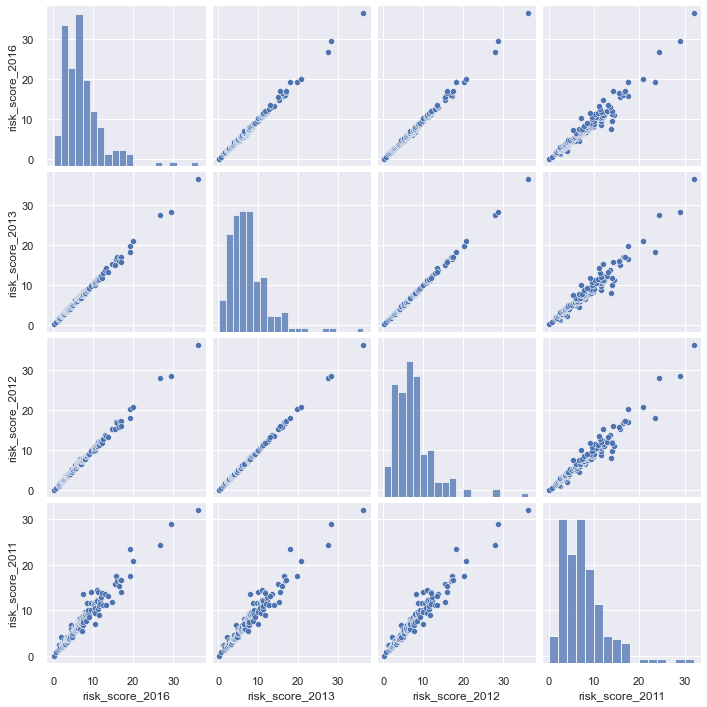

In [487]:
import seaborn as sns
sns.set()
%config InlineBackend.figure_format = 'png'
sns.pairplot(
    df_risk_sql[["risk_score_2016", "risk_score_2013", "risk_score_2012", "risk_score_2011"]]
);

In [488]:
fig = px.pie(df_death_toll_sql, values=df_death_toll_sql['Casuality Rate'], names=df_death_toll_sql['Risk Type'], title="Percentage of the Casualty Rates by disaster event")
fig.show()

In [489]:
df_death_toll_China=df_death_toll_sql.loc[df_death_toll_sql['Country Name']=='China']
fig = px.pie(df_death_toll_China, values=df_death_toll_China['Casuality Rate'], names=df_death_toll_China['Risk Type'], title="Casualty rates of China by various disaster events")
fig.show()

In [490]:
df_death_toll_India=df_death_toll_sql.loc[df_death_toll_sql['Country Name']=='India']
fig = px.pie(df_death_toll_India, values=df_death_toll_India['Casuality Rate'], names=df_death_toll_India['Risk Type'], title="Casualty Rates in India by various disaster events")
fig.show()

In [491]:
fig = px.bar(df_death_toll_sql, x=df_death_toll_sql['Casuality Rate'], y=df_death_toll_sql['Risk Type'], color=df_death_toll_sql['Risk Type'], orientation='h')
fig.show()

In [492]:
fig = px.line(df_death_toll_sql, x='Year', y='Casuality Rate',color='Country Name',markers=True, title='Disaster trends across the glob from 1920 to 2020')
fig.show()

In [493]:
fig = px.line(df_death_toll_sql, x='Year', y='Casuality Rate',color='Risk Type',markers=True, title='Death rates over the period from 1920 to 2020')
fig.show()

In [494]:
import plotly.express as px
#df_risk_sql_risk = df_risk_sql.query("Country == 'Canada'")
dfg=df_death_toll_sql.groupby('Country Name').sum().reset_index()
fig = px.bar(dfg, x='Country Name', y='Casuality Rate',title="Death rates over the country",color='Country Name',
             barmode='stack')
fig.show()

In [495]:
dfg=df_death_toll_sql[['Country Code','Casuality Rate']].groupby('Country Code').sum().reset_index()
#dfg

In [496]:
fig = px.scatter_geo(dfg, locations="Country Code",
                     size="Casuality Rate",
                     color="Country Code", # which column to use to set the color of markers
                     # opacity=0.5,
                      projection="natural earth", hover_data={'Country Code'})
fig.update_layout(title = 'Natural disaster death rates over the world from 1920 to 2020')
fig.show()

# Calling other notebooks for Integration

In [497]:
#Set current working directory
os.chdir('C:\Msc Data Analytics\Database and Analytics program\DAP_PRJ\Project files\Source codes')

['Natural_Disaster', 'US_Disaster', 'admin', 'config', 'local', 'test_database']
The database Natural_Disaster exists.
False


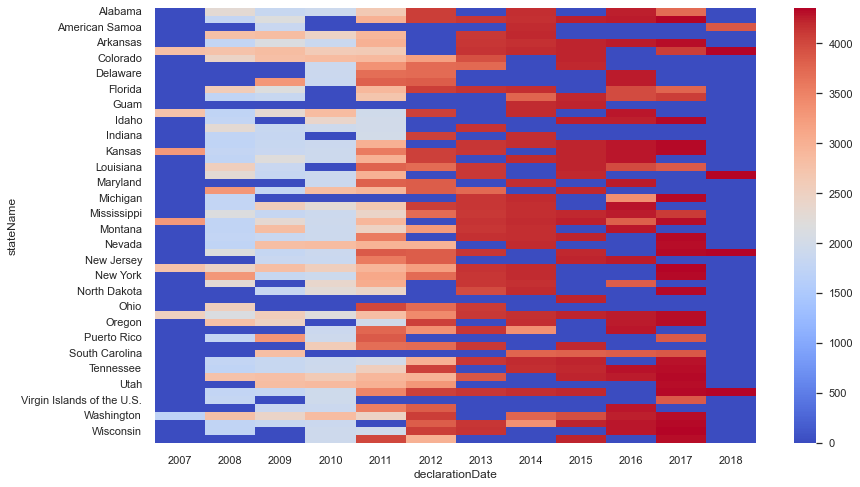

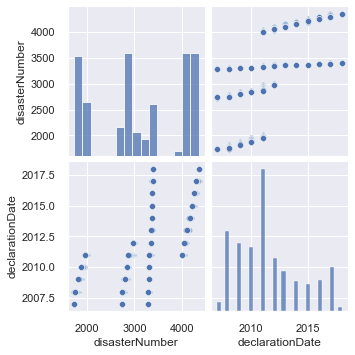

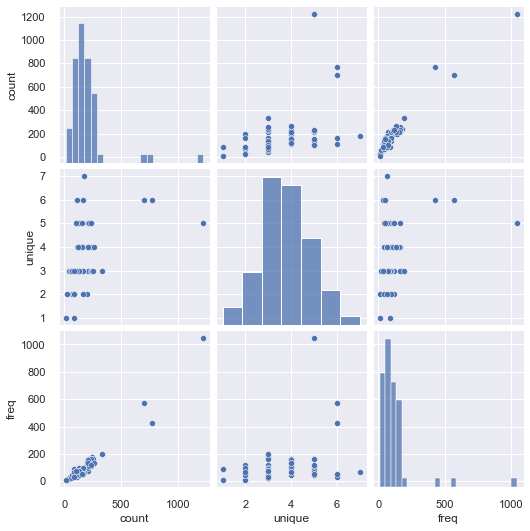

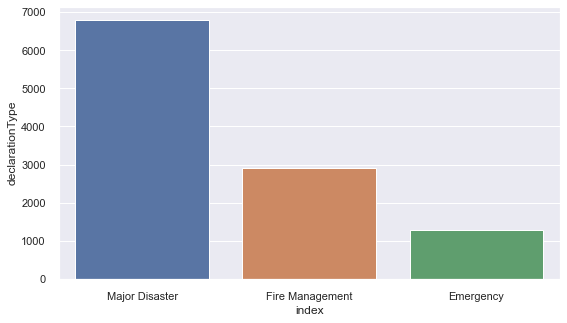

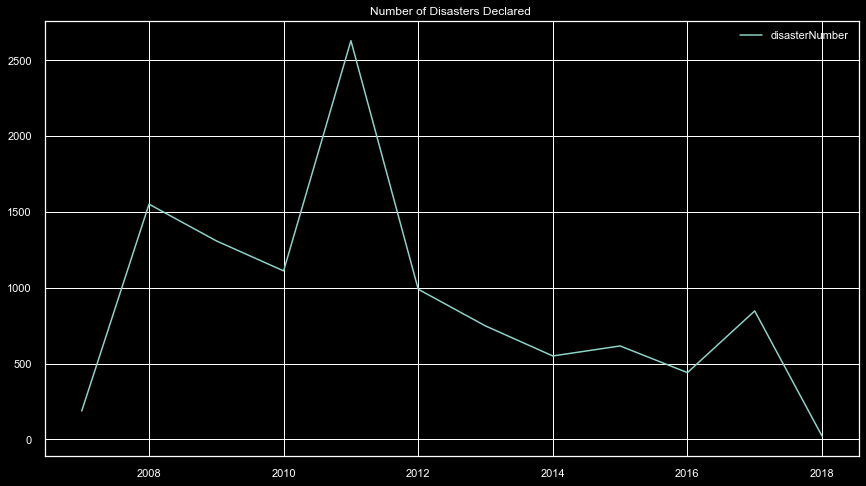

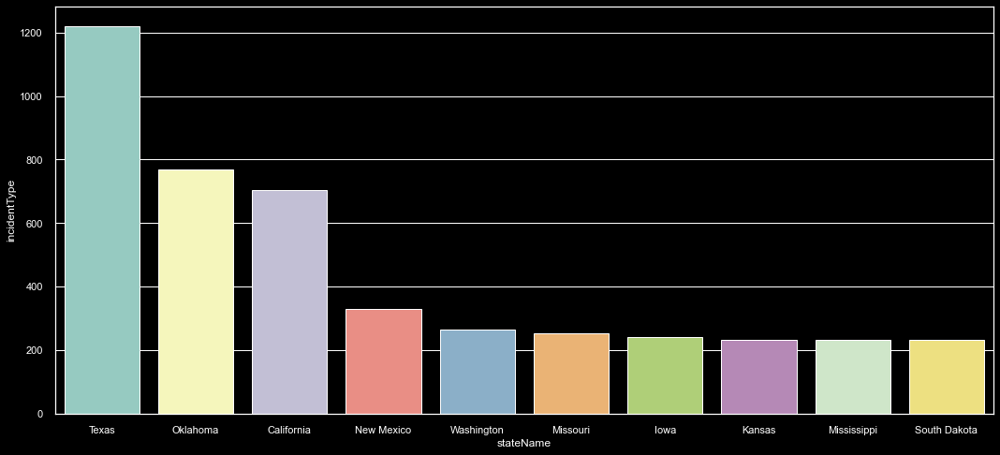

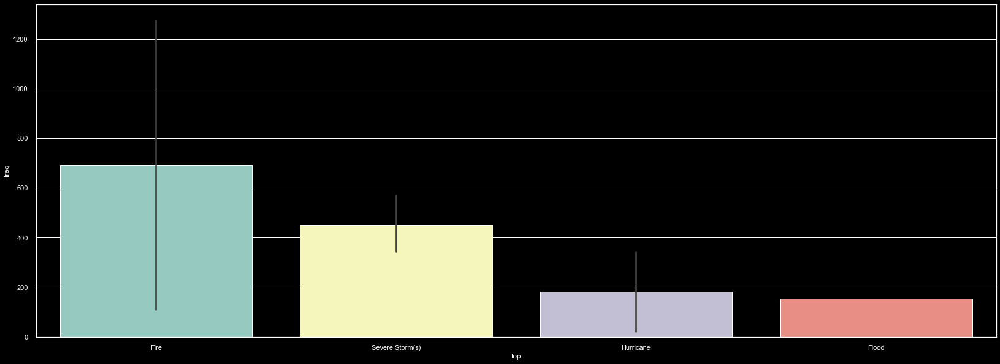

(100, '5aa2d570cb4f0f7020b17042', 4332, 'TX   ', 'Major Disaster', 'Texas', 'Hurricane', 2017)
(101, '5aa2d570cb4f0f7020b1708a', 4269, 'TX   ', 'Major Disaster', 'Texas', 'Flood', 2016)
(102, '5aa2d570cb4f0f7020b17098', 4272, 'TX   ', 'Major Disaster', 'Texas', 'Flood', 2016)
(103, '5aa2d570cb4f0f7020b170a7', 4266, 'TX   ', 'Major Disaster', 'Texas', 'Flood', 2016)
(104, '5aa2d570cb4f0f7020b1709e', 4245, 'TX   ', 'Major Disaster', 'Texas', 'Severe Storm(s)', 2015)
(105, '5aa2d570cb4f0f7020b170c7', 4255, 'TX   ', 'Major Disaster', 'Texas', 'Severe Storm(s)', 2016)
(106, '5aa2d571cb4f0f7020b17106', 4223, 'TX   ', 'Major Disaster', 'Texas', 'Severe Storm(s)', 2015)
(107, '5aa2d571cb4f0f7020b17126', 3363, 'TX   ', 'Emergency', 'Texas', 'Other', 2013)
(108, '5aa2d571cb4f0f7020b1712b', 4136, 'TX   ', 'Major Disaster', 'Texas', 'Other', 2013)
(109, '5aa2d571cb4f0f7020b17140', 4159, 'TX   ', 'Major Disaster', 'Texas', 'Severe Storm(s)', 2013)
(110, '5aa2d572cb4f0f7020b171b4', 4029, 'TX   ', 'M

In [498]:
%run ./US_Disaster_Events.ipynb

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16126 entries, 0 to 16125
Data columns (total 45 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Year                        16126 non-null  int64  
 1   Seq                         16126 non-null  int64  
 2   Glide                       1581 non-null   object 
 3   Disaster Group              16126 non-null  object 
 4   Disaster Subgroup           16126 non-null  object 
 5   Disaster Type               16126 non-null  object 
 6   Disaster Subtype            13016 non-null  object 
 7   Disaster Subsubtype         1077 non-null   object 
 8   Event Name                  3861 non-null   object 
 9   Country                     16126 non-null  object 
 10  ISO                         16126 non-null  object 
 11  Region                      16126 non-null  object 
 12  Continent                   16126 non-null  object 
 13  Location                    143

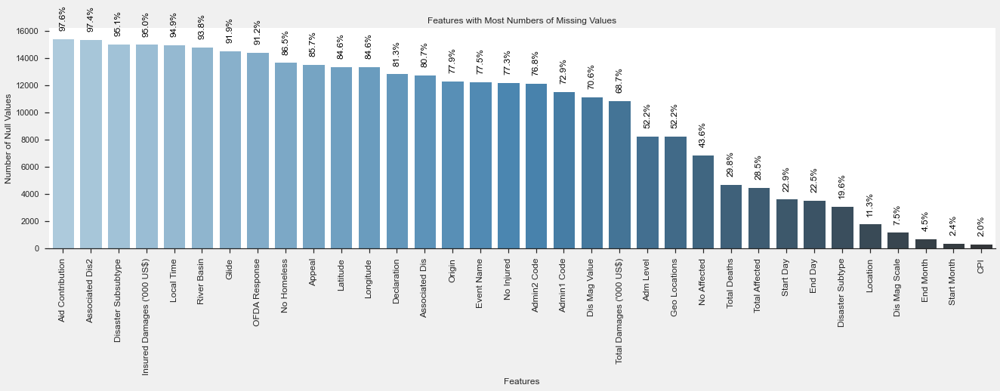

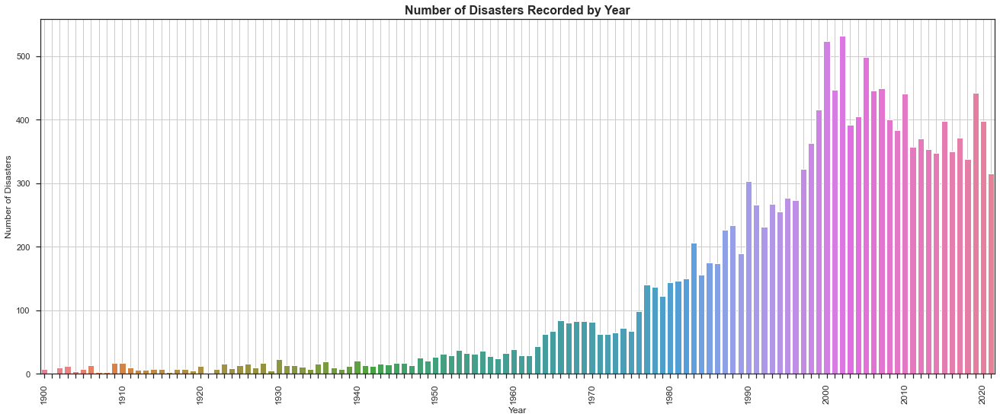

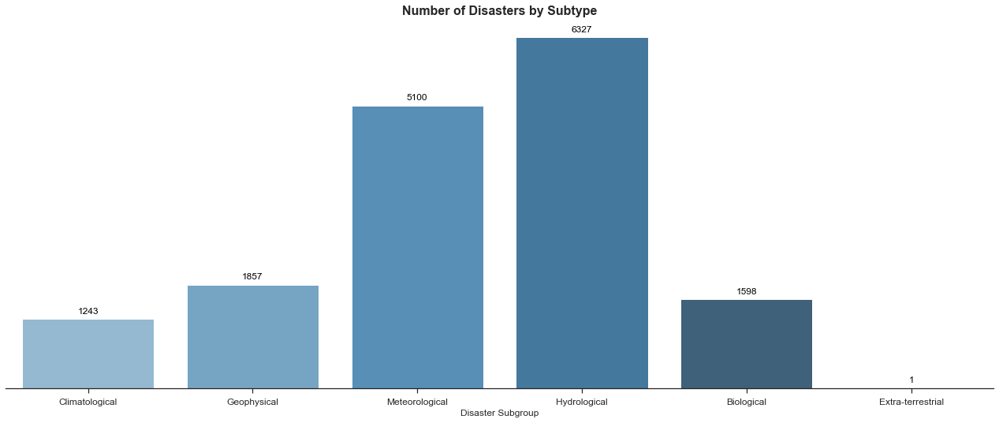

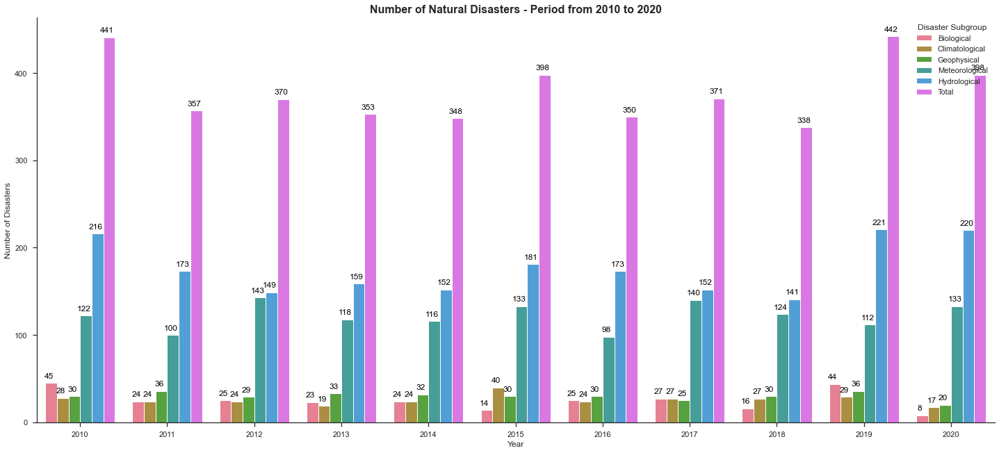

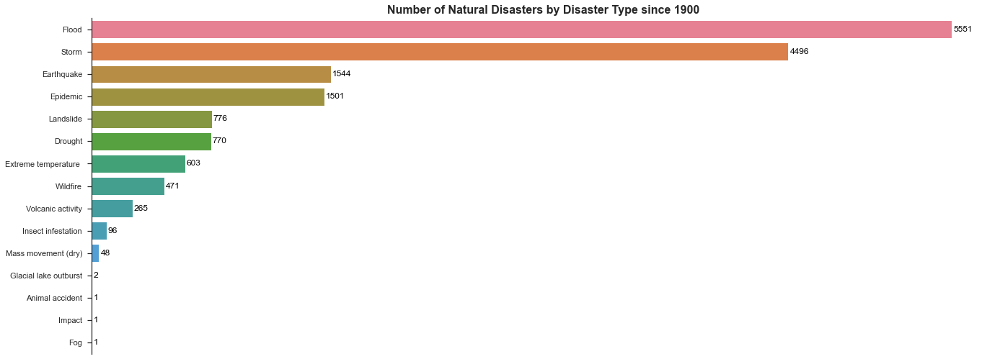

...

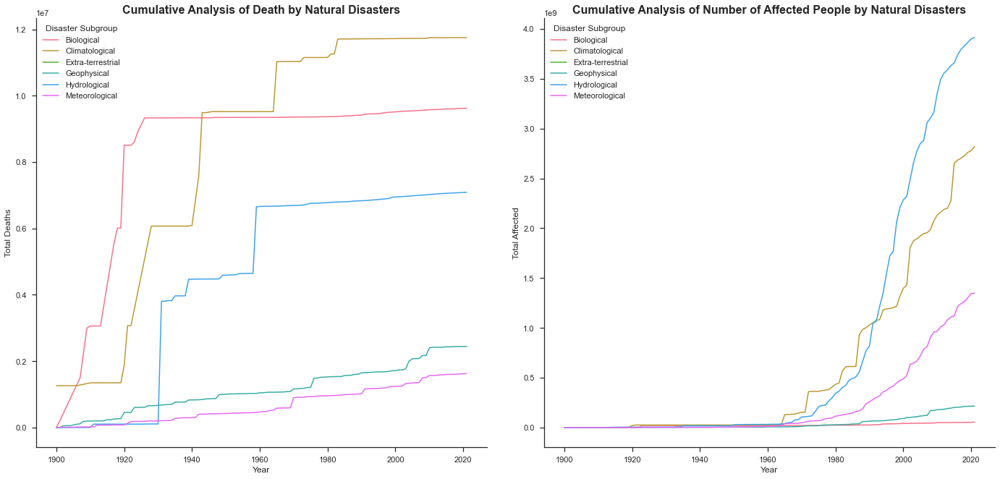

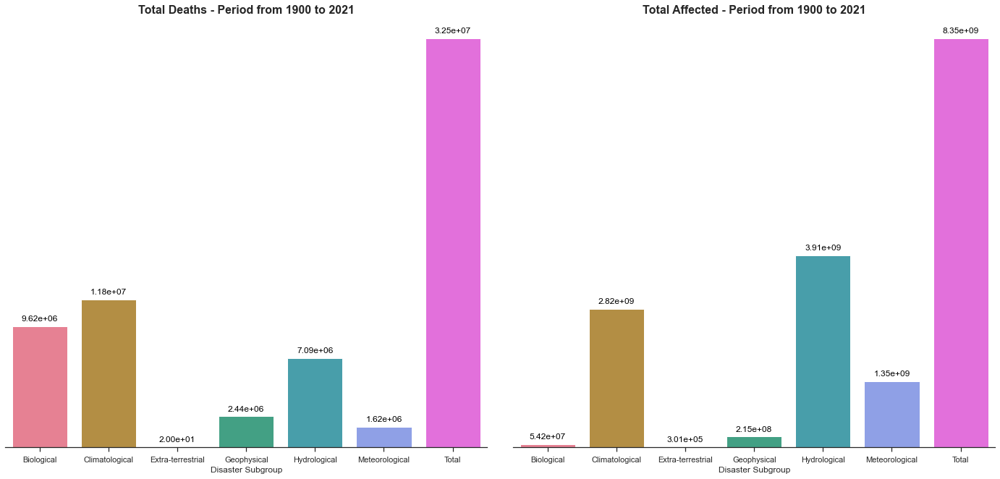

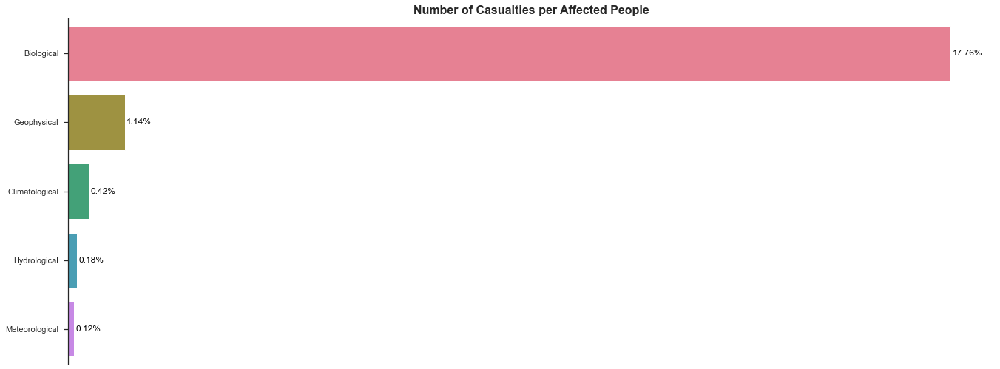

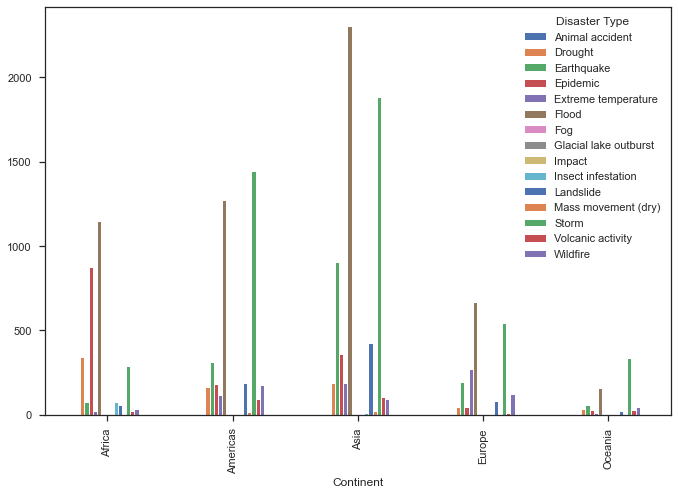

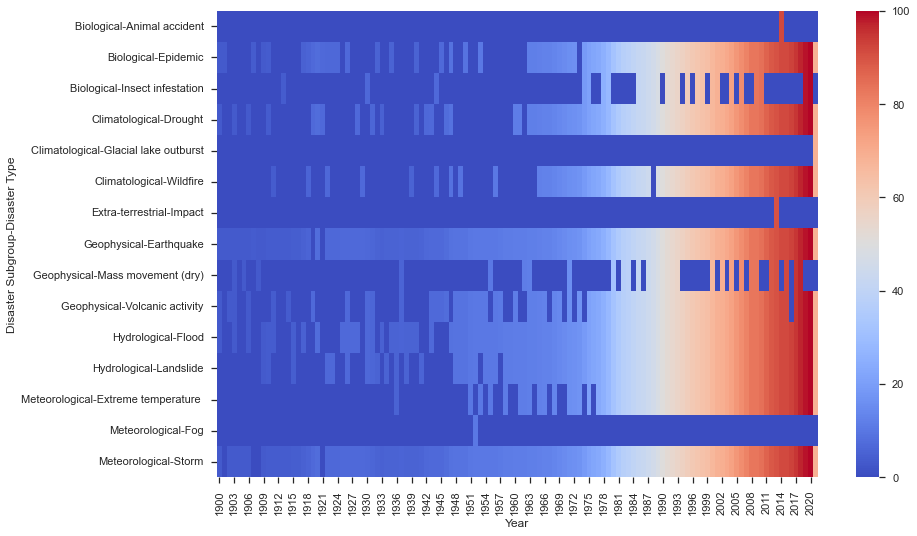

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16126 entries, 0 to 16125
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Year         16126 non-null  object        
 1   Start Month  16126 non-null  object        
 2   Start Day    16126 non-null  object        
 3   Date         16125 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(3)
memory usage: 1.1+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 16126 entries, 0 to 16125
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Year           16126 non-null  object        
 1   Start Month    16126 non-null  object        
 2   Start Day      16126 non-null  object        
 3   Date           16125 non-null  datetime64[ns]
 4   Disaster Type  16126 non-null  int32         
dtypes: datetime64[ns](1), int32(1), object(3)
memory usage: 1.2+ MB
<clas

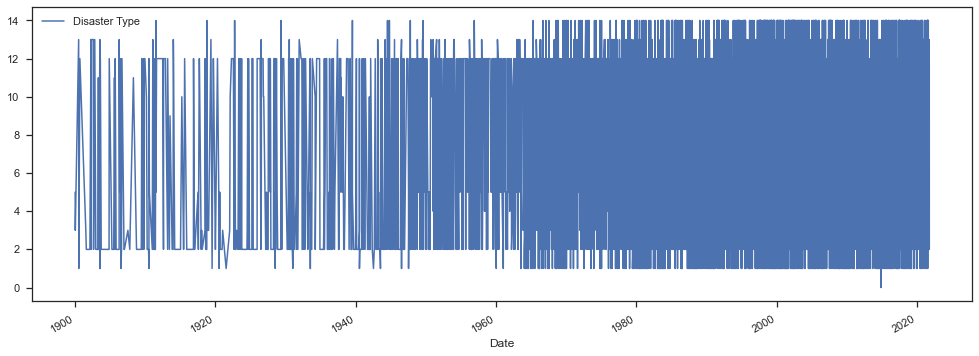

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:84626.0007700063
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:79648.13583590183
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:75979.30122750775
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:67945.47266185514
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:74429.85163739318
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:68032.45648157409
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:72446.37646946922
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:67944.99940854551
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:79897.90033710077
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:77381.6708288187
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:75966.14752192379
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:67936.59364792386
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:74336.0106166013
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:68021.96521321069
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC

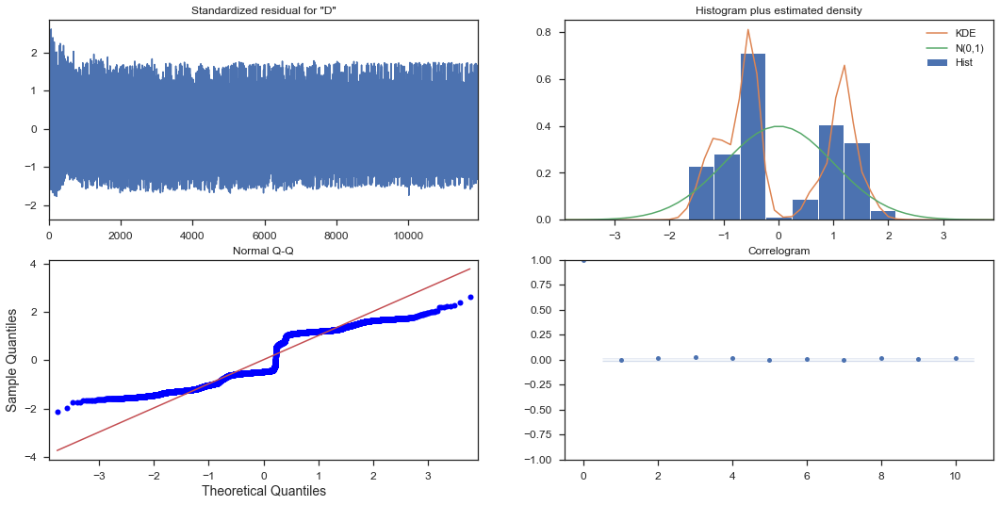

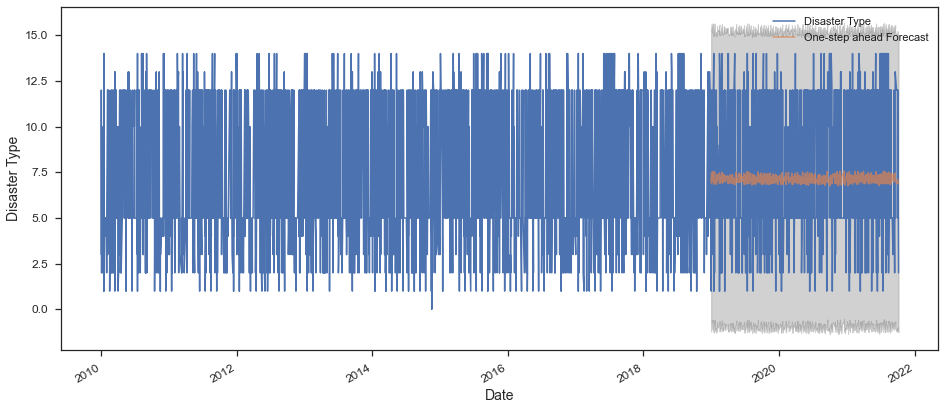

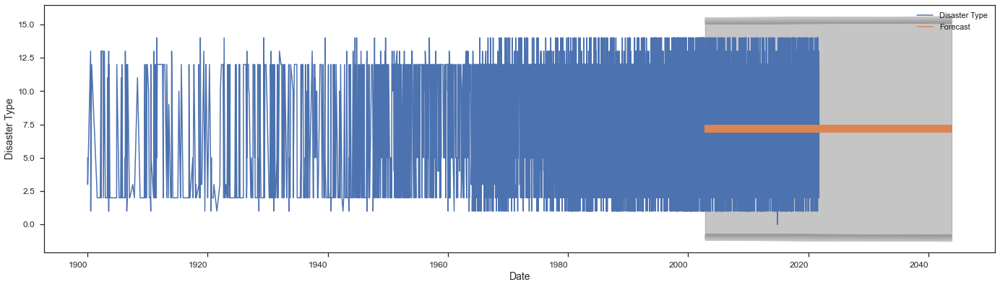

In [499]:
%run ./Natural_Disaster_Events.ipynb

In [500]:
%run ./Earthquake.ipynb

Exception: File `'./Earthquake.ipynb.py'` not found.

# Integrating datasets in Azure SQL Server

In [ ]:
#Integrating following 5 tables and creating Master_Disaster_Events
# [dbo].[country]
# [dbo].[Death_Toll_by_Disaster]
# [dbo].[RISK_COUNTRY]
# [dbo].[US_Disaster_Events]
# [dbo].[Natural_Disaster_Events]

In [ ]:
Master_Disaster_sql = "SELECT DisasterYear,Country_code,Country_Name,Latitude,Longitude,DisasterType,TotalDeaths FROM Natural_Disaster_Events UNION ALL SELECT Year,Country_Code,Country_Name,Latitude,Longitude,Type,Death_Toll FROM Death_Toll_by_Disaster"
df_Master_Disaster_sql = pd.read_sql(Master_Disaster_sql, conn)

In [ ]:
cursor.execute('''
IF OBJECT_ID('dbo.Master_Disaster_Event', 'U') IS NOT NULL 
  DROP TABLE dbo.Master_Disaster_Event; 
''')

In [ ]:
cursor.execute('''
CREATE TABLE dbo.Master_Disaster_Event(
[Event_ID] [int] IDENTITY(1000,1) primary key,
[Year] [int] NULL,
[Country_Code] [char](3) NULL,
[Country_Name] [varchar](100) NULL,
[Latitude] [float] NULL,
[Longitude] [float] NULL,
[Type] [varchar](50) NULL,
[Death_Toll] [int] NULL,
[Severity] [varchar](30) NULL)
''')

In [ ]:
df_Master_Disaster_sql.head(1)

In [ ]:
#Inserting dataframe data into dbo.Master_Disaster_Event table
for index, row in df_Master_Disaster_sql.iterrows():
    cursor.execute("INSERT INTO dbo.Master_Disaster_Event(Year,Country_Code,Country_Name,Latitude,Longitude,Type,Death_Toll) values(?,?,?,?,?,?,?)",row.DisasterYear,row.Country_code, row.Country_Name,row.Latitude,row.Longitude,row.DisasterType,row.TotalDeaths)
    conn.commit()

In [ ]:
cursor.execute('''
MERGE dbo.Master_Disaster_Event AS TARGET
USING dbo.RISK_COUNTRY AS SOURCE
ON(TARGET.Country_code = SOURCE.Country_Code)
WHEN MATCHED 
THEN UPDATE SET 
TARGET.Severity = SOURCE.Risk_Category;
''')
conn.commit()

In [ ]:
Master_Disaster_Event_sql = "SELECT * FROM dbo.Master_Disaster_Event"
df_Master_Disaster_Event_sql = pd.read_sql(Master_Disaster_Event_sql, conn)

In [ ]:
cursor.close()

In [ ]:
df_Master_Disaster_Event_sql

In [ ]:
df=df_Master_Disaster_Event_sql

# Visualizations on Master_Disaster_Event table

In [ ]:
Disaster_type= df['Type'].value_counts()
df1 = pd.DataFrame([Disaster_type]).T
print (df1)
df1.plot(kind='bar',stacked=True, figsize=(15,8))

## Above Figure shows Flood is the most prominent Disaster

In [ ]:
# Top Countries with maximum risk
p = df[['Country_Name','Type']].groupby('Country_Name').count()
p.reset_index(inplace=True)
p=p.sort_values(by='Type',ascending=False).head(10)
p

In [ ]:
fig = px.histogram(df, x="Country_Name", y="Year", color="Country_Name", marginal="rug",
                   hover_data=df.columns)
fig.show()

## Above fig shows that China Followed by United States , India , Indonesia and Phillipines are the top 5 countries effected by disasters

In [ ]:
fig = px.histogram(df, x="Year", y="Death_Toll", color="Type", marginal="rug",
                   hover_data=df.columns)
fig.show()

## Above Figure Shows 1930 - 1934 is the worst years in terms of death rate.

In [ ]:
fig = px.bar(df, x='Year', y='Death_Toll')
fig.show()

## Above fig shows that in 1931 there is arount 4 millions death count so digging more about what has happened in 1931.

In [ ]:
#bar charts
import plotly.graph_objects as go  

colors = ['lightslategray',] * 20  
colors[0] = 'crimson'

data_1931 = df.query("Year == 1931")


xvar = list(data_1931.head(30)['Country_Name'])
yvar = list(data_1931.head(30)['Type']) 

fig = go.Figure(data=[go.Bar(x=xvar,  y=yvar, marker_color=colors )])

fig.update_layout(title_text='Type of disaster happened in 1931')

### Above Figure shows that China's Flood , China's Earthquake and vocanic activity in Indonesia has caused huge loss of life in 1931
### Exploring more about china, United State , INDIA, Indonesia, Philippines as these three are the top 5 countries most effected by disaster over time

# China

In [ ]:
import plotly.graph_objects as go 
values =df.query('Country_Name=="China"')['Death_Toll'].value_counts()
m=df.query('Country_Name=="China"')['Type']
fig = go.Figure(data=[go.Pie(labels=m, values=values)])
fig.update_layout(title='China disaster observation')


fig.show()

In [ ]:
# To show which years are worst years in CHINA from disaster perspective
import plotly.express as px
df1 = df.query('Country_Name=="China"')
fig = px.histogram(df1, x="Year", y="Death_Toll", color="Year", marginal="rug",
                   hover_data=df1.columns)
fig.update_layout(title='Number of Disasters happened in China over the period of time')
fig.show()

### Above Figures shows that China has mostly effected by Storm. 1931 is the worst year in China from disaster perspective when lot of deaths were reported due to flood.

# United States

In [ ]:
import plotly.graph_objects as go 
values =df.query('Country_Name=="United States"')['Death_Toll'].value_counts()
m=df.query('Country_Name=="United States"')['Type']
fig = go.Figure(data=[go.Pie(labels=m, values=values)])
fig.update_layout(title='United States disaster observation')


fig.show()

In [ ]:
# To show which years are worst years in United States from disaster perspective
import plotly.express as px
df2 = df.query('Country_Name=="United States"')
fig = px.histogram(df2, x="Year", y="Death_Toll", color="Year", marginal="rug",
                   hover_data=df.columns)
fig.update_layout(title='Number of Disasters happened in United States over the period of time')
fig.show()

### Above Figures shows that United Staes has mostly effected by Storm. 1936 is the worst year in United States from disaster perspective when lot of deaths were reported due to heat wave.

# India

In [ ]:
import plotly.graph_objects as go 
values =df.query('Country_Name=="India"')['Death_Toll'].value_counts()
m=df.query('Country_Name=="India"')['Type']
fig = go.Figure(data=[go.Pie(labels=m, values=values)])
fig.update_layout(title='India disaster observation')


fig.show()

In [ ]:
# To show which years are worst years in India from disaster perspective
import plotly.express as px
df3 = df.query('Country_Name=="India"')
fig = px.histogram(df3, x="Year", y="Death_Toll", color="Year", marginal="rug",
                   hover_data=df3.columns)
fig.update_layout(title='Number of Disasters happened in India over the period of time')
fig.show()

### Above Figures shows that India has mostly effected by Flood. 1970 is the worst year in India from disaster perspective when lot of deaths were reported due to Tropical Cyclone.

# Indonesia

In [ ]:
import plotly.graph_objects as go 
values =df.query('Country_Name=="Indonesia"')['Death_Toll'].value_counts()
m=df.query('Country_Name=="Indonesia"')['Type']
fig = go.Figure(data=[go.Pie(labels=m, values=values)])
fig.update_layout(title='Indonesia disaster observation')


fig.show()

In [ ]:
# To show which years are worst years in Indonesia from disaster perspective
import plotly.express as px
df4 = df.query('Country_Name=="Indonesia"')
fig = px.histogram(df4, x="Year", y="Death_Toll", color="Year", marginal="rug",
                   hover_data=df4.columns)
fig.update_layout(title='Number of Disasters happened in Indonesia over the period of time')
fig.show()

### Above Figures shows that Indonesia has mostly effected by Earthquake. 2004 is the worst year in Indonesia from disaster perspective when lot of deaths were reported due to Tsunami.

# Philippines

In [ ]:

import plotly.graph_objects as go 
values =df.query('Country_Name=="Philippines"')['Death_Toll'].value_counts()
m=df.query('Country_Name=="Philippines"')['Type']
fig = go.Figure(data=[go.Pie(labels=m, values=values)])
fig.update_layout(title='Philippines disaster observation')


fig.show()

In [ ]:
# To show which years are worst years in Philippines from disaster perspective
import plotly.express as px
df5 = df.query('Country_Name=="Philippines"')
fig = px.histogram(df5, x="Year", y="Death_Toll", color="Year", marginal="rug",
                   hover_data=df5.columns)
fig.update_layout(title='Number of Disasters happened in Philippines over the period of time')
fig.show()

### Above Figures shows that Philippines has mostly effected by Storm. 1922 is the worst year in Philippines from disaster perspective when lot of deaths were reported due to Tropical Cyclone.